# Advanced Lane Line Finding

## The goal of this project is to write a software pipeline to identify the lane boundaries in a video from a front-facing camera on a car.

In [1]:
import os
import sys
import cv2
import math
import glob
import pickle
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML
import matplotlib.image as mpimg
from moviepy.editor import VideoFileClip

%matplotlib inline

In [2]:
def grayscale(img, colorspace):
    """Applies the Grayscale transform
    This will return an image with only one color channel
    but NOTE: to see the returned image as grayscale
    (assuming your grayscaled image is called 'gray')
    you should call plt.imshow(gray, cmap='gray')"""
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY if (colorspace is 'BGR') else cv2.COLOR_RGB2GRAY)
    
def canny(img, low_threshold, high_threshold):
    """Applies the Canny transform"""
    return cv2.Canny(img, low_threshold, high_threshold)

def gaussian_blur(img, kernel_size):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image


class Lane:
    
    """
    Lane class defines a lane by its slope (m) and y-intercept (c)
    Points (x1,y1) and (x2,y2) are 
    calculated based on the region of interest passed to the constructor
    """
    
    def __init__(self, m, c, bottom, top):
        self.m = m
        self.c = c
        
        self.x1 = int((bottom-c)/m)
        self.y1 = int(bottom)
        
        self.x2 = int((top-c)/m)        
        self.y2 = int(top)
    
    def get_lines(self):
        return [(self.x1, self.y1), (self.x2, self.y2)]
    
    def calc_y_for_x(self, x):
        return (self.m * x) + self.c
    
    def calc_x_for_y(self, y):
        return (y - self.c) / self.m
    
    def draw(self, img, color=[255, 0, 0], thickness=10):
        cv2.line(img, (self.x1, self.y1), (self.x2, self.y2), color, thickness)
        

def draw_lines(img, lines, color=[255, 0, 0], thickness=10):
    
    right_lane_slopes = []
    left_lane_slopes = []
    
    right_lane_intercepts = []
    left_lane_intercepts = []
    
    for line in lines:
        for x1,y1,x2,y2 in line:
            
            m = (y2-y1)/(x2-x1) #slope
            c = y1-(m*x1) #y-intercept
            
            if(m>0): #if the line belongs to the right lane
                right_lane_slopes.append(m)
                right_lane_intercepts.append(c)
                
            elif(m<0): #if the line belongs to the left lane
                left_lane_slopes.append(m)
                left_lane_intercepts.append(c)
                
    #find median slope and y-intercept for right lane
    right_lane_m = np.median(right_lane_slopes) 
    right_lane_c = int(np.median(right_lane_intercepts))

    #find median slope and y-intercept for left lane
    left_lane_m = np.median(left_lane_slopes)
    left_lane_c = int(np.median(left_lane_intercepts))
    
    #calculate region of interest
    bottom_left, bottom_right, top = calculate_region_of_interest(img)
    
    #initialize lanes with slope, y-intercept, bottom y, and top y
    left_lane = Lane(left_lane_m, left_lane_c, bottom_left[1], top[1])
    right_lane = Lane(right_lane_m, right_lane_c, bottom_right[1], top[1])
    
    #draw lanes
    left_lane.draw(img, color, thickness)
    right_lane.draw(img, color, thickness)
    
    return [left_lane, right_lane]

def hough_lines(img, rho, theta, threshold, min_line_len, max_line_gap):
    """
    `img` should be the output of a Canny transform.
        
    Returns an image with hough lines drawn.
    """
    lines = cv2.HoughLinesP(img, rho, theta, threshold, np.array([]), minLineLength=min_line_len, maxLineGap=max_line_gap)
    line_img = np.zeros((img.shape[0], img.shape[1], 3), dtype=np.uint8)
    lanes = draw_lines(line_img, lines)
    return line_img, lanes

# Python 3 has support for cool math symbols.

def weighted_img(img, initial_img, α=0.8, β=1., γ=0.):
    """
    `img` is the output of the hough_lines(), An image with lines drawn on it.
    Should be a blank image (all black) with lines drawn on it.
    
    `initial_img` should be the image before any processing.
    
    The result image is computed as follows:
    
    initial_img * α + img * β + γ
    NOTE: initial_img and img must be the same shape!
    """
    return cv2.addWeighted(initial_img, α, img, β, γ)

In [3]:
def calculate_region_of_interest(image):
    """
    calculates the trapezoid region of interest for a given image
    """
    bottom_left = (0,image.shape[0])
    top = (image.shape[1]/2,(image.shape[0]/2)+50)
    bottom_right = (image.shape[1],image.shape[0])
    
    return bottom_left, bottom_right, top

In [4]:
def find_img_and_obj_points(add, nx, ny, imsave=False):
    """
    Finds image points (real chessboard corners on the image)
    and object points (ideal chessboard corners)
    """
    # Make a list of calibration images
    images = glob.glob(add)

    # Arrays to store object points and image points for all images

    objpoints = []
    imgpoints = []

    # Prepare object points 

    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

    fig = plt.figure(figsize=(20,30))
    
    index = 0 
    
    for ix, fname in enumerate(images):
        img = cv2.imread(fname)

        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)

        if ret == True:
            index = index + 1 
            
            imgpoints.append(corners)
            objpoints.append(objp)

            img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            fig.add_subplot(7,3,index)
            if imsave:
                plt.imsave('./output_images/find_corners_output/calibration%d.png' % ix, img)
            plt.imshow(img)

    return imgpoints, objpoints

In [5]:
def calibrate_camera(objpoints, imgpoints, imshape, save=False):
    """
    gives camera calibration data for given image points and object points and the image size
    """
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imshape, None, None)
    
    if save:
        with open('calibration_data.pkl', 'wb') as output:
            calibration_data = (ret, mtx, dist, rvecs, tvecs)
            pickle.dump(calibration_data, output, pickle.HIGHEST_PROTOCOL)
        
    return ret, mtx, dist, rvecs, tvecs 

In [6]:
def correct_for_distortion(img, mtx, dist):
    """
    undistorts a given frame using given calibration data
    """
    return cv2.undistort(img, mtx, dist, None, mtx)

def correct_for_distortion_dir(add, mtx, dist, showFig=False, saveFig=False, imsave=False):
    """
    undistorts all images in a given directory using given calibration data
    """
    # Make a list of distorted images
    images = glob.glob(add)
    ret = []

    for ix, fname in enumerate(images):
        img = plt.imread(fname)
        
        dst = correct_for_distortion(img, mtx, dist)
        
        ret.append(dst)
        
        if showFig:
            fig = plt.figure(figsize=(16,4))

            fig.add_subplot(1,2,1)
            plt.title('Original')
            plt.imshow(img)

            fig.add_subplot(1,2,2)
            plt.title('Undistorted')
            plt.imshow(dst)
            
        if saveFig:
            plt.savefig('./figures/%s_distortion_fig.png' % os.path.basename(fname)[:-4])

        if imsave:
            plt.imsave('./output_images/distortion_correction_output/%s.png' % os.path.basename(fname)[:-4], dst)
            
    return ret[0] if (len(ret) == 1) else tuple(ret)

In [7]:
def abs_sobel_threshold(gray, sobel_kernel=3, orient='x', thresh=(0,255)):
    """
    returns a thresholded image using absolute sobel
    """
    # Take the derivative in x or y given orient = 'x' or 'y'
    sobel = cv2.Sobel(gray, cv2.CV_64F, (orient == 'x'), (orient == 'y'), ksize=sobel_kernel)
    
    # Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    
    # Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    binary_output = np.zeros_like(scaled_sobel)
    
    # Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return binary_output
 

In [8]:
def sobel_mag_threshold(gray, sobel_kernel=3, thresh=(0, 255)):
    """
    returns a thresholded image using sobel magnitude
    """
    # Convert to grayscale
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    
    # Take the gradient in x and y separately
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Calculate the magnitude 
    sobel_mag = np.sqrt(sobelx**2 + sobely**2)
    
    # Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scale_factor = np.max(sobel_mag)/255 
    
    # Create a binary mask where mag thresholds are met
    sobel_mag = (sobel_mag/scale_factor).astype(np.uint8) 
    binary_output = np.zeros_like(gray)
    binary_output[(sobel_mag >= thresh[0]) & (sobel_mag <= thresh[1])] = 1
    
    # Return this mask as your binary_output image
    return binary_output

In [9]:
def sobel_dir_threshold(gray, sobel_kernel=3, thresh=(0, np.pi/2)):
    """
    returns a thresholded image using sobel direction
    """
    # Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)

    #  Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    
    # Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    
    # Create a binary mask where direction thresholds are met
    binary_output = np.zeros_like(gray)
    binary_output[(grad_dir >= thresh[0]) & (grad_dir <= thresh[1])] = 1

    # Return this mask as your binary_output image
    return binary_output

In [10]:
def hls_s_select(img, thresh=(0, 255)):
    """
    returns the S channel in the HLS colorspace for a given image
    """
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Apply a threshold to the S channel
    # H = hls[:,:,0]
    # L = hls[:,:,1]
    S = hls[:,:,2]

    # Return a binary image of threshold result
    binary_output = np.zeros_like(S)
    binary_output[(S > thresh[0]) & (S <= thresh[1])] = 1
    return binary_output

def hls_l_select(img, thresh=(0, 255)):
    """
    returns the L channel in the HLS colorspace for a given image
    """
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    
    # Apply a threshold to the L channel
    # H = hls[:,:,0]
    L = hls[:,:,1]
    #S = hls[:,:,2]
    
    # Return a binary image of threshold result
    L = L*(255/np.max(L))
    binary_output = np.zeros_like(L)
    binary_output[(L > thresh[0]) & (L <= thresh[1])] = 1
    return binary_output

def lab_b_select(img, thresh=(0, 255)):
    """
    returns the B channel in the LAB colorspace for a given image
    """    
    # Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    
    # Apply a threshold to the B channel
    B = lab[:,:,2]
    
    # Return a binary image of threshold result
    binary_output = np.zeros_like(B)
    binary_output[(B > thresh[0]) & (B <= thresh[1])] = 1
    return binary_output

def hsv_v_select(img, thresh=(0, 255)):
    """
    returns the V channel in the HSV colorspace for a given image
    """    
    # Convert to HSV color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
    
    # Apply a threshold to the S channel
    # H = hls[:,:,0]
    # S = hls[:,:,1]
    V = hls[:,:,2]
    
    # Return a binary image of threshold result
    binary_output = np.zeros_like(V)
    binary_output[(V > thresh[0]) & (V <= thresh[1])] = 1
    return binary_output

In [11]:
def draw_lane_lines(image, imshow=False, imsave=False):
    """
    returns an image with draw lane lines using a basic pipeline for a given image
    """
    path = './output_images/simple_laneline_pipeline_stages/'
    
    #transform image to grayscale
    image_gray = grayscale(image, 'BGR')
    
    if imshow:
        plt.figure()
        plt.title('Grayscale')
        plt.imshow(image_gray)
        
    if imsave:
        plt.imsave(path+'1_grayscale.png', image_gray, cmap='gray')
    
    #smooth image out using gaussian blur with mask size of 11x11
    image_smoothed = gaussian_blur(image,11)
    
    if imshow:
        plt.figure()
        plt.title('Smoothed')
        plt.imshow(image_smoothed)
        
    if imsave:
        plt.imsave(path+'2_smoothed.png', image_smoothed, cmap='gray')
    
    #define parameters for canny edge detection
    low_threshold = 30
    high_threshold = 60
    
    #perform canny edge detection
    image_canny = canny(image_smoothed, low_threshold, high_threshold)
    
    if imshow:
        plt.figure()
        plt.title('Canny')
        plt.imshow(image_canny)
        
    if imsave:
        plt.imsave(path+'3_canny.png', image_canny, cmap='gray')
    
    #define vertices for region of interest triangle mask
    bottom_left, bottom_right, top = calculate_region_of_interest(image)
    mask_vertices = np.int32([[bottom_left, top, bottom_right]])
    
    #apply region of interest mask
    image_masked = region_of_interest(image_canny, mask_vertices)
    
    if imshow:
        plt.figure()
        plt.title('Masked')
        plt.imshow(image_masked)
        
    if imsave:
        plt.imsave(path+'4_masked.png', image_masked, cmap='gray')
    
    #define parameters for hough lines algorithm
    rho = 1
    theta = np.pi/180
    threshold = 10
    min_line_len = 12
    max_line_gap = 5  
    
    #perform hough lines transformation
    image_hough, lanes = hough_lines(image_masked, rho, theta, threshold, min_line_len, max_line_gap)
    
    if imshow:
        plt.figure()
        plt.title('Hough')
        plt.imshow(image_hough)
        
    if imsave:
        plt.imsave(path+'5_hough.png', image_hough, cmap='gray')
    
    #draw lines on the original image
    image_weighted = weighted_img(image_hough, image)
    
    if imshow:
        plt.figure()
        plt.title('Weighted')
        plt.imshow(image_weighted)
        
    if imsave:
        plt.imsave(path+'6_weighted.png', image_weighted, cmap='gray')
    
    if imshow:
        plt.figure()
        plt.title('Extended')
        plt.imshow(image_weighted)
        
    if imsave:
        plt.imsave(path+'7_extended.png', image_weighted, cmap='gray')
    
    return image_weighted, lanes

In [12]:
class Trapezoid:
    def __init__(self, bp1, bp2, tp1, tp2):
        self.bp1 = bp1
        self.bp2 = bp2
        self.tp1 = tp1
        self.tp2 = tp2
        
    def get_base_points(self):
        return (self.bp1, self.bp2)
    
    def get_top_points(self):
        return (self.tp1, self.tp2)
    
    def draw(self, img, color=[255, 0, 0], thickness=10):
        cv2.line(img, (int(self.bp1[0]), int(self.bp1[1])), (int(self.bp2[0]), int(self.bp2[1])), color, thickness)
        cv2.line(img, (int(self.bp1[0]), int(self.bp1[1])), (int(self.tp2[0]), int(self.tp2[1])), color, thickness)
        cv2.line(img, (int(self.tp1[0]), int(self.tp1[1])), (int(self.tp2[0]), int(self.tp2[1])), color, thickness)
        cv2.line(img, (int(self.tp1[0]), int(self.tp1[1])), (int(self.bp2[0]), int(self.bp2[1])), color, thickness)
    

def find_trapezoid(im, draw=False, imshow=False, imsave=False):
    """"
    Finds trapezoid area in an image
    """
    image_weighted, lanes = draw_lane_lines(im)
    
    lane_1 = lanes[0].get_lines()
    lane_2 = lanes[1].get_lines()
    
    trapezoid_base_point_1 = lane_1[0]
    trapezoid_base_point_2 = lane_2[0]
    
    trapezoid_top_y = (trapezoid_base_point_1[1] * 2/3) - 30
    
    trapezoid_top_point_1 = (lanes[0].calc_x_for_y(trapezoid_top_y), trapezoid_top_y)
    trapezoid_top_point_2 = (lanes[1].calc_x_for_y(trapezoid_top_y), trapezoid_top_y)
    
    trap = Trapezoid(trapezoid_base_point_1, trapezoid_base_point_2, trapezoid_top_point_2, trapezoid_top_point_1)
    
    if draw:
        trap.draw(im)
    if imshow:
        plt.title('Image with trapezoid')
        plt.imshow(im)
    if imsave:
        plt.imsave('./output_images/image_w_trapezoid/straight_lines2_w_trapezoid.png',im)
        
    return trap

In [13]:
def trapezoid_birds_eye_view_transform(img, trapezoid):
    """
    Performs perspective transformation on a given image using a given trapezoid into a rectangle
    """
    img_size = (img.shape[1],img.shape[0])
    
    src_base_points = trapezoid.get_base_points()
    dst_base_points = [(512,720), (768,720)]

    src_top_points = trapezoid.get_top_points()
    dst_top_points = [(512,20), (768,20)]

    src = np.float32([src_base_points[0], src_base_points[1], src_top_points[0], src_top_points[1]])
    dst = np.float32([dst_base_points[0], dst_base_points[1], dst_top_points[1], dst_top_points[0]]) 

    M = cv2.getPerspectiveTransform(src, dst)
    M_inv = cv2.getPerspectiveTransform(dst, src)

    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return warped, M, M_inv
    
def trapezoid_birds_eye_view_transform_dir(add, trapezoid, fig=False, imsave=False):
    """
    Performs perspective transformation on a given directory of images using a given trapezoid into a rectangle
    """
    images = glob.glob(add)
    ret = []

    for ix, fname in enumerate(images):
        
        img = plt.imread(fname)
        
        warped, M, M_inv = trapezoid_birds_eye_view_transform(img, trapezoid)
        
        ret.append((warped, M, M_inv))

        if fig:
            fig = plt.figure(figsize=(16,4))
            
            fig.add_subplot(1,2,1)
            plt.title('Original')
            plt.imshow(img, cmap = 'gray')

            fig.add_subplot(1,2,2)
            plt.title('Warped Image')
            plt.imshow(warped, cmap='gray')
            
            plt.savefig('./figures/%s_perspective_fig.png' % os.path.basename(fname)[:-4], cmap='gray')
            
        if imsave:
            plt.imsave('./output_images/perspective_transformation_output/%s.png' % os.path.basename(fname)[:-4], warped, cmap='gray')
            
    return ret[0] if (len(ret) == 1) else tuple(ret)

In [14]:
def generate_thresholded_binary(img, l_low_thresh, l_high_thresh, b_low_thresh, b_high_thresh):
    """
    Generate a binary image using supplied thresholds for hLs and laB channels for a given image
    """
    test_img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    l_binary = hls_l_select(test_img, thresh=(l_low_thresh, l_high_thresh))
    b_binary = lab_b_select(test_img, thresh=(b_low_thresh, b_high_thresh))
    combined_binary = np.zeros_like(gray)
    combined_binary[(b_binary == 1) | (l_binary == 1)] = 1
    return combined_binary

    
def generate_thresholded_binary_dir(add, l_low_thresh, l_high_thresh, b_low_thresh, b_high_thresh, fig=False, imsave=False):
    """
    Generate a binary image using supplied thresholds for hLs and laB channels for a given directory of images
    """
    images = glob.glob(add)
    ret = []

    for ix, fname in enumerate(images):
        
        img = cv2.imread(fname)
        
        combined_binary = generate_thresholded_binary(img, l_low_thresh, l_high_thresh, b_low_thresh, b_high_thresh)

        ret.append(combined_binary)

        if fig:
            fig = plt.figure(figsize=(16,4))
            
            fig.add_subplot(1,2,1)
            plt.title('Original')
            plt.imshow((cv2.cvtColor(img, cv2.COLOR_BGR2RGB)))

            fig.add_subplot(1,2,2)
            plt.title('Thresholded Binary')
            plt.imshow(combined_binary, cmap='gray')
            
            plt.savefig('./figures/%s_binary_fig.png' % os.path.basename(fname)[:-4])
        
        if imsave:
            plt.imsave('./output_images/thresholding_binary_output/%s.png' % os.path.basename(fname)[:-4], combined_binary, cmap='gray')
            
    return ret[0] if (len(ret) == 1) else tuple(ret)

In [15]:
def sliding_window(img, num_of_windows, margin, min_num_of_px):
    """
    fit line to binary image of lane lines using sliding window
    """
    nonzero_inds = img.nonzero()

    left_lane_x_pxs = []
    left_lane_y_pxs = []
    right_lane_x_pxs = []
    right_lane_y_pxs = []
    
    windows = []
    window_height = np.int(img.shape[0]/num_of_windows)
    
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    center = np.int(histogram.shape[0]//2)
    lower_quartile = np.int(center//2)
    upper_quartile = center + lower_quartile
    left_x_center = np.argmax(histogram[lower_quartile:center]) + lower_quartile
    right_x_center = np.argmax(histogram[center:upper_quartile]) + center

    for window in range(num_of_windows):
        
        # define window vertices
        win_bottom_y = img.shape[0] - (window+1) * window_height
        win_top_y = img.shape[0] - window * window_height
        
        win_left_x_start = left_x_center - margin
        win_left_x_end = left_x_center + margin
        
        win_right_x_start = right_x_center - margin
        win_right_x_end = right_x_center + margin
                
        # find pixels inside the window     
        nonzero_inds_in_left_window = ((nonzero_inds[0] >= win_bottom_y)
                                       & (nonzero_inds[0] < win_top_y)
                                       & (nonzero_inds[1] >= win_left_x_start)
                                       & (nonzero_inds[1] < win_left_x_end)).nonzero()[0]
        
        nonzero_inds_in_right_window = ((nonzero_inds[0] >= win_bottom_y)
                                        & (nonzero_inds[0] < win_top_y)
                                        & (nonzero_inds[1] >= win_right_x_start)
                                        & (nonzero_inds[1] < win_right_x_end)).nonzero()[0]
        
        y_left_pxs = nonzero_inds[0][nonzero_inds_in_left_window]
        x_left_pxs = nonzero_inds[1][nonzero_inds_in_left_window]
        y_right_pxs = nonzero_inds[0][nonzero_inds_in_right_window]
        x_right_pxs = nonzero_inds[1][nonzero_inds_in_right_window]
        
        # find center for next window
        if len(x_left_pxs) > min_num_of_px:
            left_x_center = np.int(np.mean(x_left_pxs))
        if len(x_right_pxs) > min_num_of_px:
            right_x_center = np.int(np.mean(x_right_pxs))
                    
        left_lane_x_pxs.append(x_left_pxs)
        left_lane_y_pxs.append(y_left_pxs)
        right_lane_x_pxs.append(x_right_pxs)
        right_lane_y_pxs.append(y_right_pxs)
        windows.append((win_bottom_y, win_top_y, win_left_x_start, win_left_x_end, win_right_x_start, win_right_x_end))

    left_lane_x = np.concatenate(left_lane_x_pxs)
    left_lane_y = np.concatenate(left_lane_y_pxs)
    right_lane_x = np.concatenate(right_lane_x_pxs)
    right_lane_y = np.concatenate(right_lane_y_pxs)

    left_fit = None
    right_fit = None
    ret = True
    
    if len(left_lane_x) != 0:
        left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    else:
        ret = False
        
    if len(right_lane_x) != 0:
        right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    else:
        ret = False
        
    return ret, left_fit, right_fit, left_lane_x, right_lane_x, left_lane_y, right_lane_y, windows, histogram

In [16]:
prev_left_fit = None
prev_right_fit = None

def find_lanes(img, num_of_windows, margin, min_num_of_px):
    """
    Performs sliding window lane finding on a given image
    """
    global prev_left_fit
    global prev_right_fit
    ret, left_fit, right_fit, left_lane_x, right_lane_x, left_lane_y, right_lane_y, windows, histogram = sliding_window(img, num_of_windows, margin, min_num_of_px)

    h = img.shape[0]
    
    out_img = np.uint8(np.dstack((img, img, img))*255)
    ploty = np.linspace(0, img.shape[0]-1, img.shape[0] )

    if(ret):
        prev_left_fit = left_fit
        prev_right_fit = right_fit
        left_fit_x_int = left_fit[0]*h**2 + left_fit[1]*h + left_fit[2]
        right_fit_x_int = right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    else: # if the sliding window function fails to detect usable fits, we use the previous fit
        left_fit_x_int = prev_left_fit[0]*h**2 + prev_left_fit[1]*h + prev_left_fit[2]
        right_fit_x_int = prev_right_fit[0]*h**2 + prev_right_fit[1]*h + prev_right_fit[2]
        left_fitx = prev_left_fit[0]*ploty**2 + prev_left_fit[1]*ploty + prev_left_fit[2]
        right_fitx = prev_right_fit[0]*ploty**2 + prev_right_fit[1]*ploty + prev_right_fit[2]
        
    for window in windows:
        cv2.rectangle(out_img,(window[2],window[0]),(window[3],window[1]),(255,255,255), 2) 
        cv2.rectangle(out_img,(window[4],window[0]),(window[5],window[1]),(255,255,255), 2) 
    
    out_img[left_lane_y, left_lane_x] = [255, 0, 0]
    out_img[right_lane_y, right_lane_x] = [0, 0, 255]
    
    return ret, out_img, left_fit, right_fit, ploty, left_fitx, right_fitx, left_lane_x, right_lane_x, left_lane_y, right_lane_y, histogram

def find_lanes_dir(add, num_of_windows, margin, min_num_of_px, fig=False, imsave=False):
    """
    Performs sliding window lane finding on a given directory of image
    """
    images = glob.glob(add)
    ret = []

    for ix, fname in enumerate(images):
        
        img = cv2.imread(fname, 0)
        
        chck, out, left_fit, right_fit, ploty, left_fitx, right_fitx, _ , _, _, _, histogram = find_lanes(img, num_of_windows, margin, min_num_of_px)
        
        ret.append((chck, out, left_fit, right_fit, ploty, left_fitx, right_fitx))

        if fig:
            fig = plt.figure(figsize=(16,4))
            
            fig.add_subplot(1,3,1)
            plt.title('Original')
            plt.imshow(img, cmap = 'gray')

            fig.add_subplot(1,3,2)
            plt.title('Sliding Window Output')
            plt.imshow(out)
            plt.plot(left_fitx, ploty, color='white')
            plt.plot(right_fitx, ploty, color='white')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)
            
            fig.add_subplot(1,3,3)
            plt.title('Histogram')
            plt.plot(histogram)
            
            plt.savefig('./figures/%s_sliding_fig.png' % os.path.basename(fname)[:-4], cmap='gray')
            
        if imsave:
            plt.imsave('./output_images/sliding_window_output/%s.png' % os.path.basename(fname)[:-4], out, cmap='gray')
            
    return ret[0] if (len(ret) == 1) else tuple(ret)

In [78]:
def measure_curvature_real(shape, ploty, left_fit, right_fit):
    """
    Calculates the curvature of polynomial functions in meters.
    """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/256 # meters per pixel in x dimension
    
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    left_fit_cr = np.polyfit(ploty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = np.max(ploty)
    
    ##### calculation of R_curve (radius of curvature) #####
    left_curve_rad = ((1+(2*left_fit_cr[0]*y_eval*ym_per_pix+left_fit_cr[1])**2)**(3/2)/np.absolute(2*left_fit_cr[0]))  ## Implement the calculation of the left line here
    right_curve_rad = ((1+(2*right_fit_cr[0]*y_eval*ym_per_pix+right_fit_cr[1])**2)**(3/2)/np.absolute(2*right_fit_cr[0]))  ## Implement the calculation of the right line here   

    curv_rad = (left_curve_rad+right_curve_rad)/2
    
    h = shape[0]
    
    lane_center = (left_fit[0]*h**2 + left_fit[1]*h + left_fit[2] + right_fit[0]*h**2 + right_fit[1]*h + right_fit[2]) /2
    
    dist_from_center = (shape[1]/2 - lane_center) * xm_per_pix
    
    return curv_rad, dist_from_center

def add_curvature_data(img, ploty, left_fitx, right_fitx):
    """
    Prints curvature data on a given image
    """
    ret = np.copy(img)
    
    curv_rad, dist_from_center = measure_curvature_real(img.shape, ploty, left_fitx, right_fitx)
        
    font = cv2.FONT_HERSHEY_DUPLEX
    
    text_1 = 'Radius of Curvature: ' + '{:04.2f}'.format(curv_rad) + 'm'
    text_2 = 'Car is ' + '{:04.2f}'.format(abs(dist_from_center)) + 'm ' + ('left' if dist_from_center < 0 else 'right') + ' from center'
    
    cv2.putText(ret, text_1, (40,70), font, 1.5, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(ret, text_2, (40,120), font, 1.5, (255,255,255), 2, cv2.LINE_AA)
    
    return ret

In [62]:
def draw_lane(original_img, binary_img, left_fitx, right_fitx, left_fit, right_fit, Minv):
    """
    Retransforms a given image into its original perspective for a given image
    """
    new_img = np.copy(original_img)
    
    if left_fit is None or right_fit is None:
        return original_img

    zero = np.zeros_like(binary_img).astype(np.uint8)
    color = np.dstack((zero, zero, zero))
    
    height, width = binary_img.shape
    ploty = np.linspace(0, height-1, num=height)
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    left_points = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    right_points = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    points = np.hstack((left_points, right_points))

    cv2.fillPoly(color, np.int_([points]), (255, 0, 0))
    cv2.polylines(color, np.int32([left_points]), isClosed=False, color=(255,255,0), thickness=14)
    cv2.polylines(color, np.int32([right_points]), isClosed=False, color=(255,255,0), thickness=14)

    warp = cv2.warpPerspective(color, Minv, (width, height)) 

    lanes = cv2.addWeighted(new_img, 1, warp, 0.5, 0)
    
    result = add_curvature_data(lanes, ploty, left_fit, right_fit)

    return result

def draw_lanes_dir(add, lanes_out, presp_out, fig=False, imsave=False):
    """
    Retransforms a given image into its original perspective for a given directory of images
    """
    images = glob.glob(add)
    ret = []

    for ix, fname in enumerate(images):
        
        orig_img = cv2.imread('./test_images/'+os.path.basename(fname)[:-4]+'.jpg')
        bin_img = cv2.imread(fname, 0)
        
        chck, out, left_fit, right_fit, _, left_fitx, right_fitx = lanes_out[ix]
        
        Minv = persp_out[ix][2]
        
        result = draw_lane(orig_img, bin_img, left_fitx, right_fitx, left_fit, right_fit, Minv)
        
        result = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)
                
        ret.append(result)
                           
        if fig:
            fig = plt.figure(figsize=(16,4))
            
            fig.add_subplot(1,2,1)
            plt.title('Original')
            plt.imshow(bin_img, cmap = 'gray')

            fig.add_subplot(1,2,2)
            plt.title('Projected Lanes Output')
            plt.imshow(result)
            plt.savefig('./figures/%s_lane_projection_fig.png' % os.path.basename(fname)[:-4], cmap='gray')
            
        if imsave:
            plt.imsave('./output_images/lane_projection_output/%s.png' % os.path.basename(fname)[:-4], result)
            
    return ret[0] if (len(ret) == 1) else tuple(ret)

## I start by calculating the object and image points for a set of images of a 9x6 chessboard taken with the same camera as the one used in the car.

### The image points represent the chessboard corners in the photos and the object points represent the ideal chessboard positions. Only photos were the chessboard was detected successfully are outputted.

### Then camera calibration data (mtx, dist, rvecs, tvecs) is calculated using all the image and object points generated.

### The output is saved into the 'find_corners_output' directory.

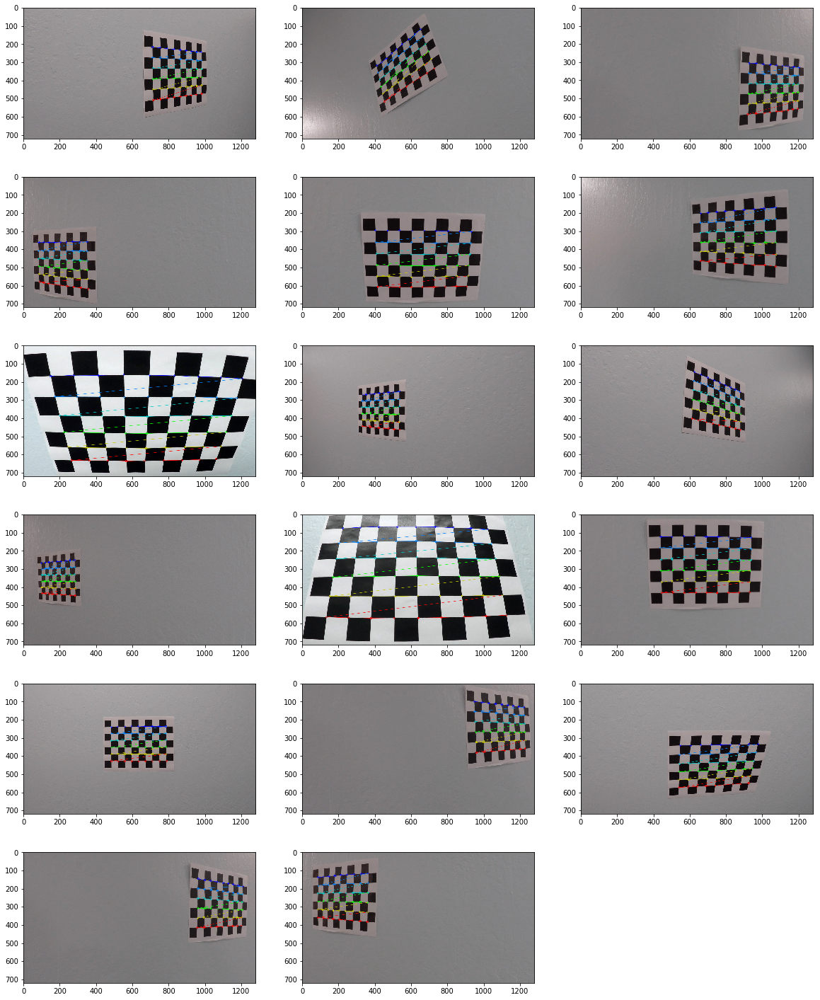

In [34]:
calibration_images_address = './camera_cal/calibration*.jpg'
imgpoints, objpoints = find_img_and_obj_points(calibration_images_address, 9, 6, imsave=False)
ret, mtx, dist, rvecs, tvecs  = calibrate_camera(objpoints, imgpoints, (1280, 720), save=True)

## After calculating the calibration data, I test it by using it to calibrate all the chessboard images and observing the results.

Testing Distortion Correction


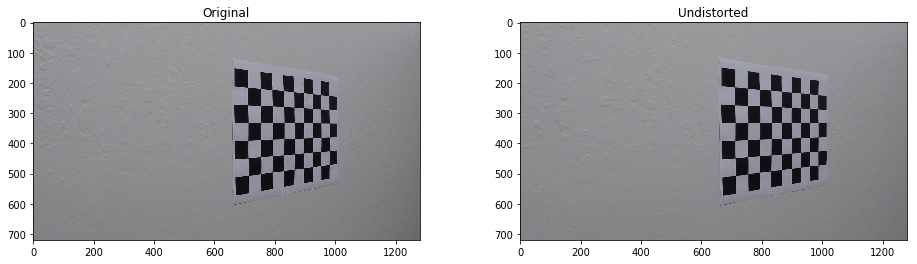

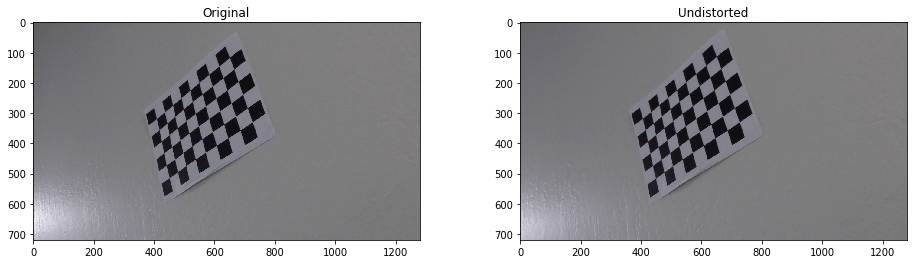

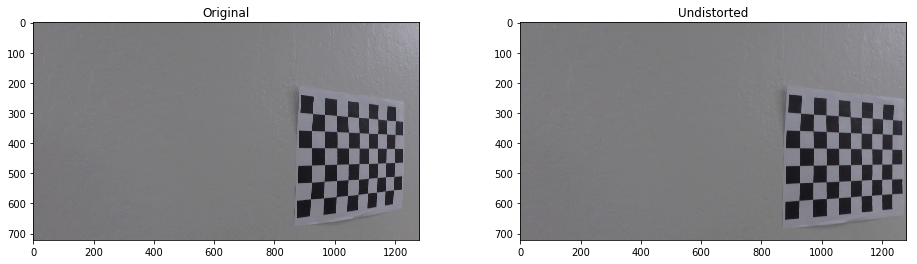

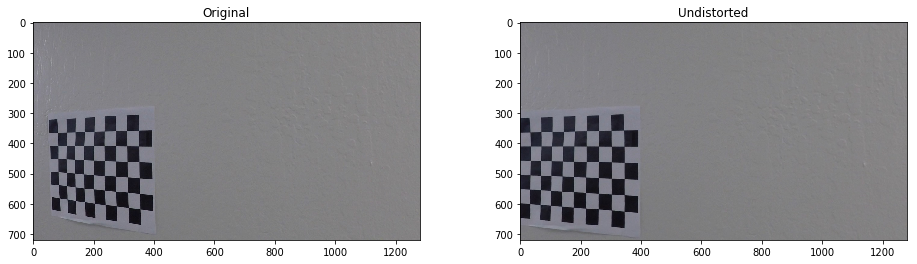

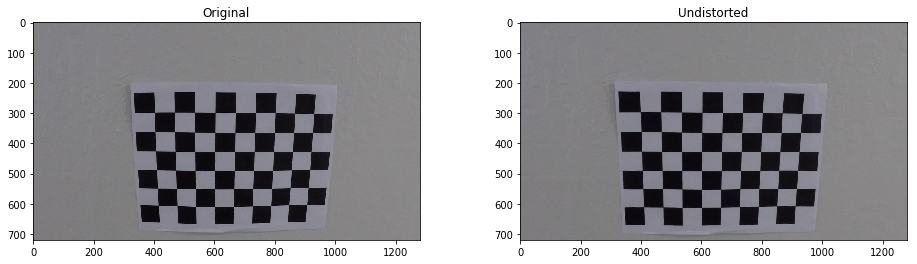

...

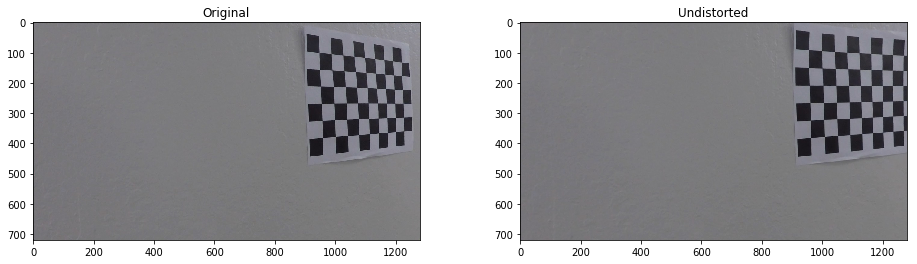

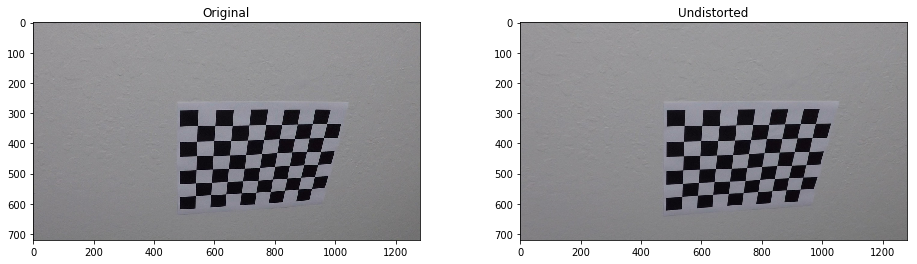

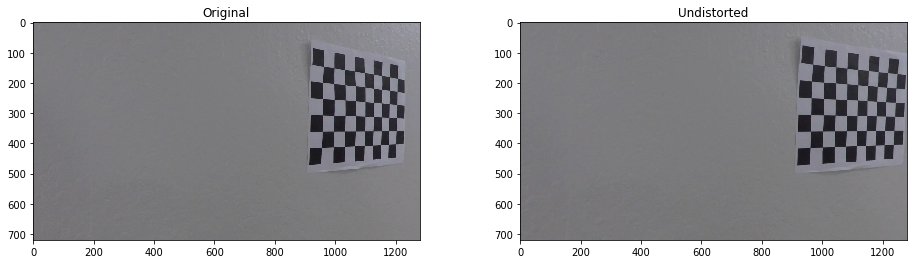

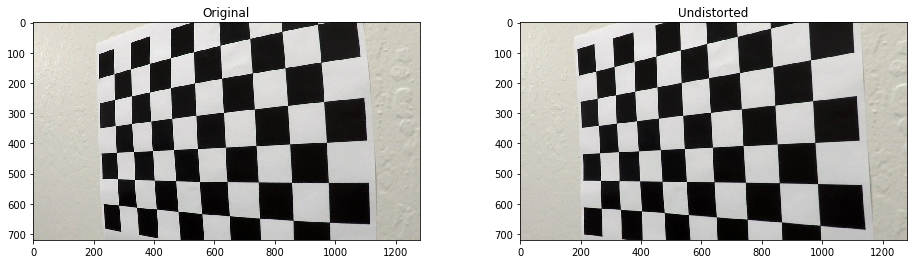

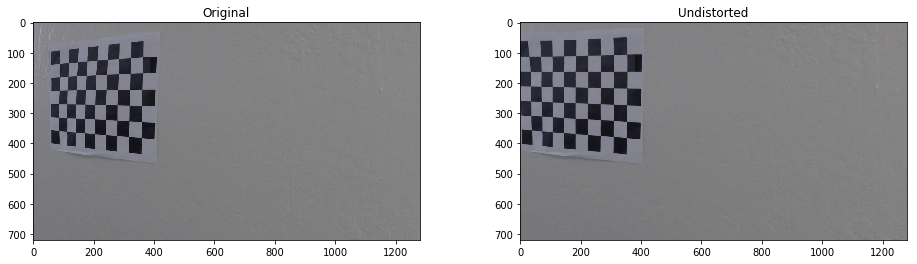

In [35]:
correct_for_distortion_dir(calibration_images_address, mtx, dist, showFig=True, saveFig=False, imsave=False)
print('Testing Distortion Correction')

## The calibartion results seem okay.

## Then I use the same data to calibrate the test images of the road and save the output to the 'distortion_correction_output' directory

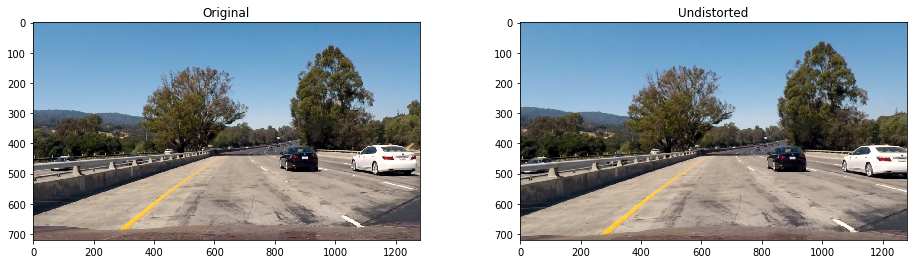

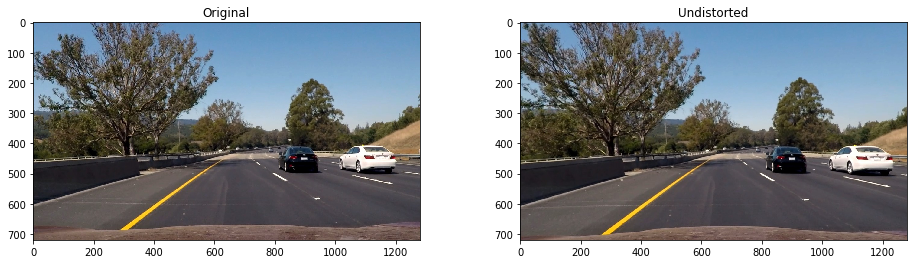

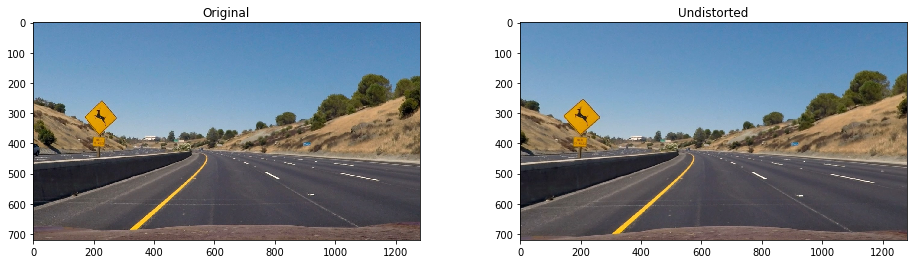

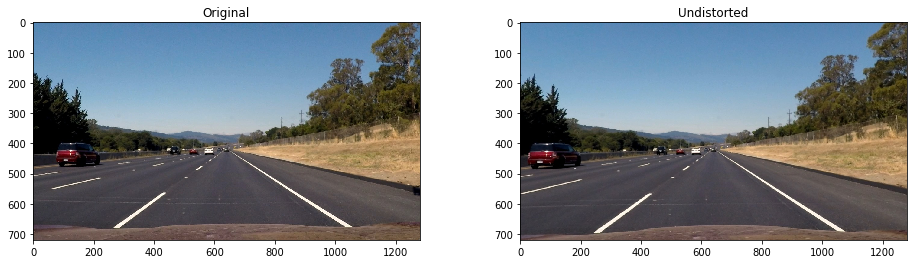

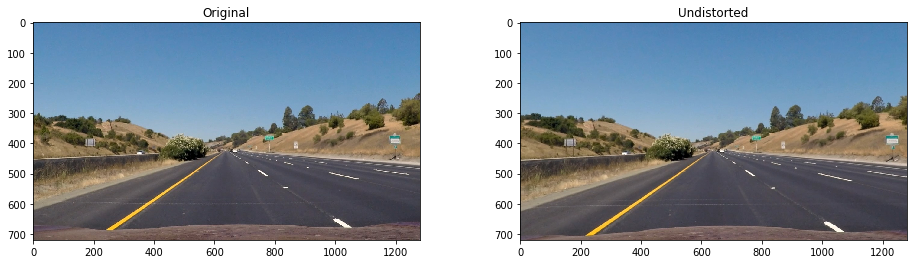

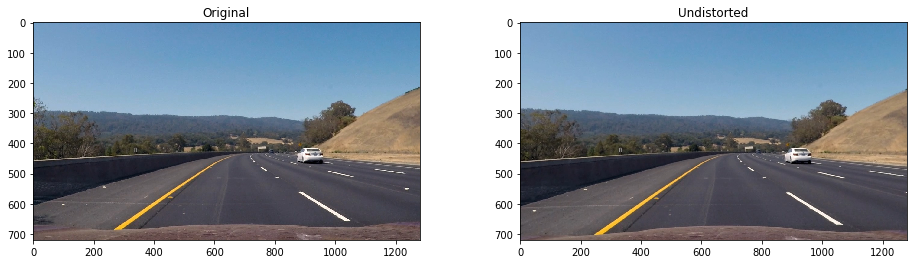

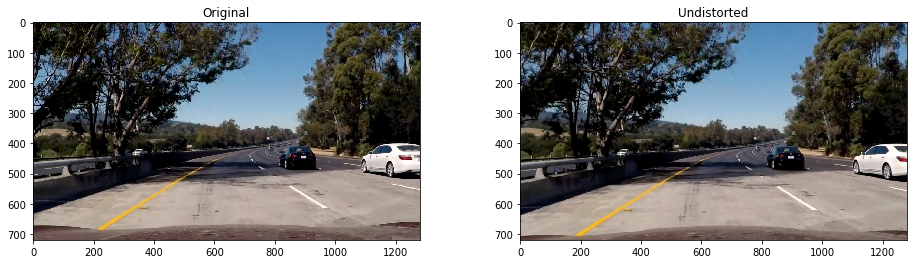

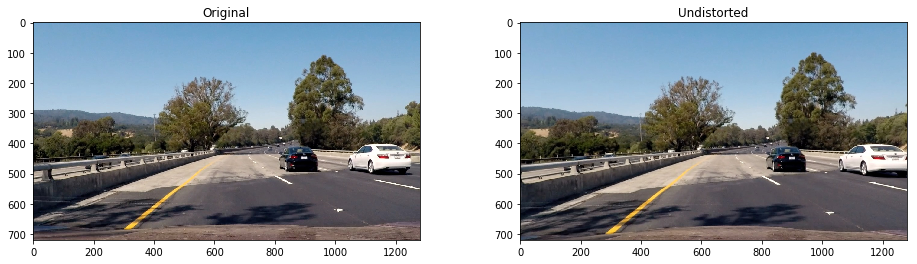

In [36]:
undist = correct_for_distortion_dir('./test_images/*', mtx, dist, showFig=True, saveFig=False, imsave=False)

## Next, I used a simple lane detection pipeline on one of the test images with straight line lanes to extract a trapezoid representing the lanes to use it later for perspective transformations.

### Note that this trapezoid is generated once then used for all transformations later. The reason we don't need to re-generate it for each frame is that the vertical angle of the camera is fixed in all photos so the same trapezoid should be valid for all of them.

### The output is saved to the 'image_w_trapezoid' directory

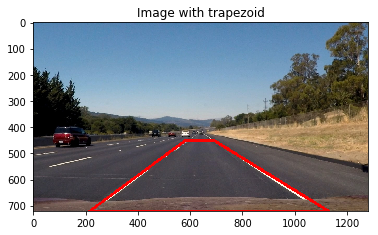

In [37]:
im = plt.imread('./test_images/straight_lines2.jpg')
trapezoid = find_trapezoid(im, draw=True, imshow=True, imsave=False)

## Now that I have the trapezoid shape, I transform this shape into a rectangle filling the frame vertically to get a Bird's Eye Perspective Transformation of the road. This makes it easier to fit a polynomial to the lanes.

### The output is saved to the 'perspective_transformation_output' directory. 

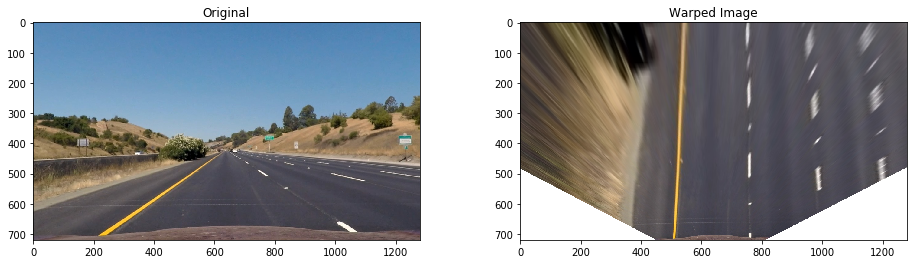

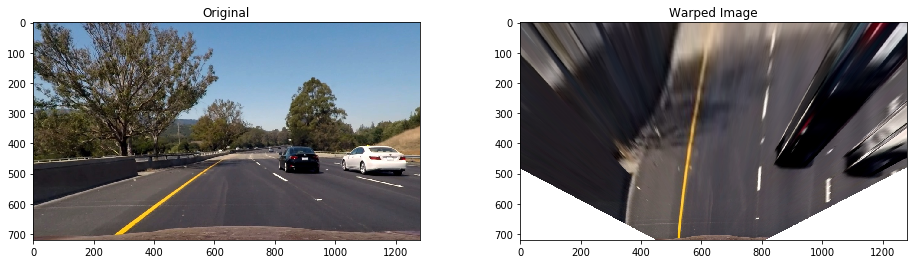

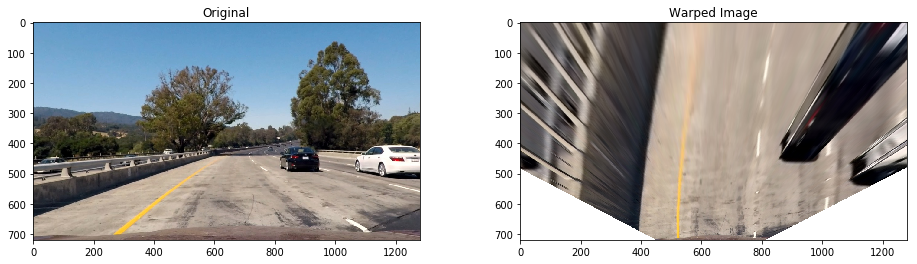

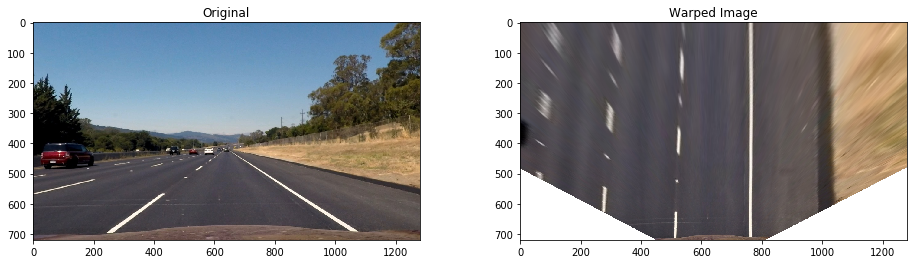

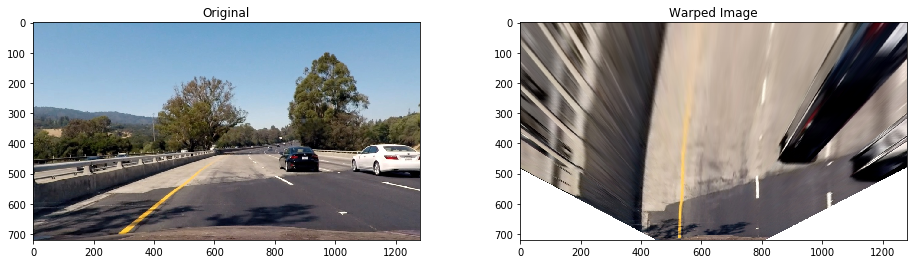

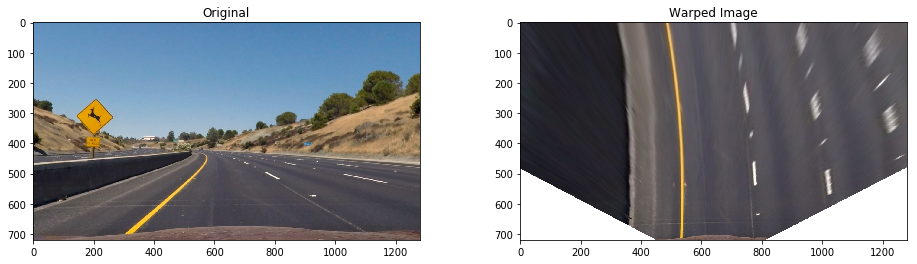

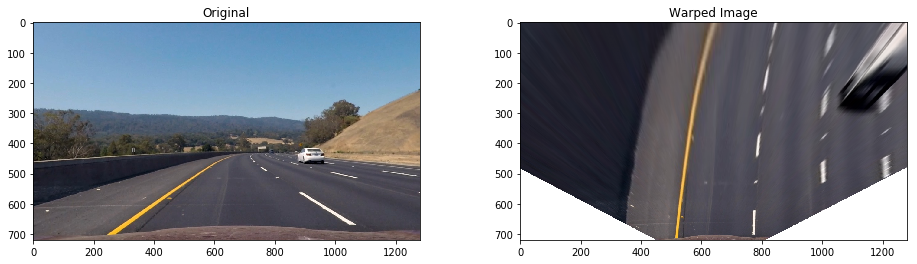

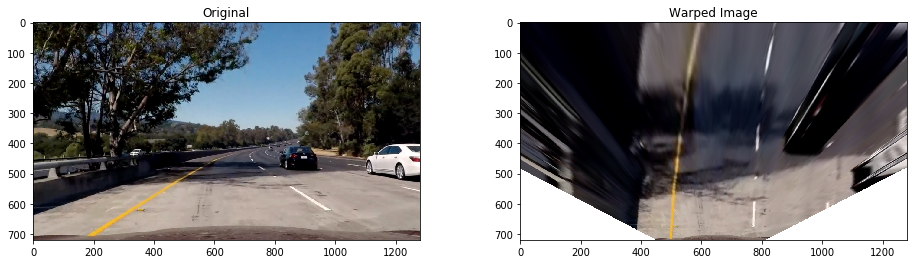

In [38]:
persp_out = trapezoid_birds_eye_view_transform_dir('./output_images/distortion_correction_output/*', trapezoid, fig=True, imsave=False)

## In the next step, I observe four different colorspace channels and try to determine which ones best suit our needs for extracting the white and yellow lane lines. 

### I tested the HLS L channel, HLS S channel, LAB B channel, and finally HSV V channel.

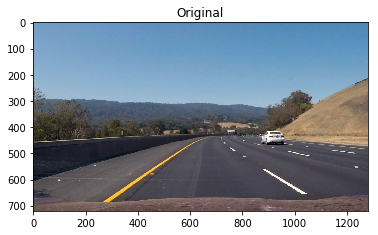

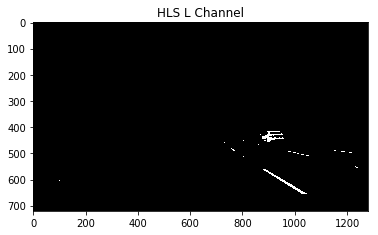

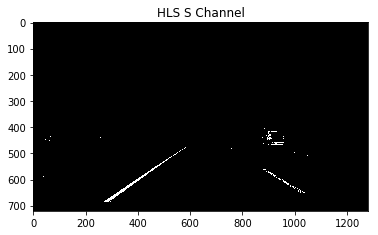

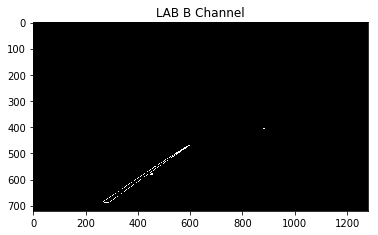

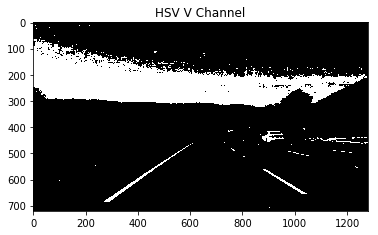

In [26]:
im = cv2.imread('./test_images/test3.jpg')
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

fig = plt.figure()
plt.title('Original')
plt.imshow(im)
fig.savefig('./figures/colorspaces/original.png')

fig = plt.figure()
plt.title('HLS L Channel')
plt.imshow(hls_l_select(im, (200,255)), cmap='gray')
fig.savefig('./figures/colorspaces/HLS_L.png')

fig = plt.figure()
plt.title('HLS S Channel')
plt.imshow(hls_s_select(im, (200,255)), cmap='gray')
fig.savefig('./figures/colorspaces/HLS_S.png')

fig = plt.figure()
plt.title('LAB B Channel')
plt.imshow(lab_b_select(im, (160,180)), cmap='gray')
fig.savefig('./figures/colorspaces/LAB_B.png')

fig = plt.figure()
plt.title('HSV V Channel')
plt.imshow(hsv_v_select(im, (200,255)), cmap='gray')
fig.savefig('./figures/colorspaces/HSV_V.png')


## By observing the results above, I noticed that the HLS L channel is good at separating the white lanes, and the LAB B channel is good at separating the yellow lanes.

## After some trial and error, I combine both channels to generate a binary image using (220, 255) thresholds for the L channel, and (160, 170) thresholds for the B channel.

### The Binary Thresholding output is saved to the 'thresholding_binary_output' directory.

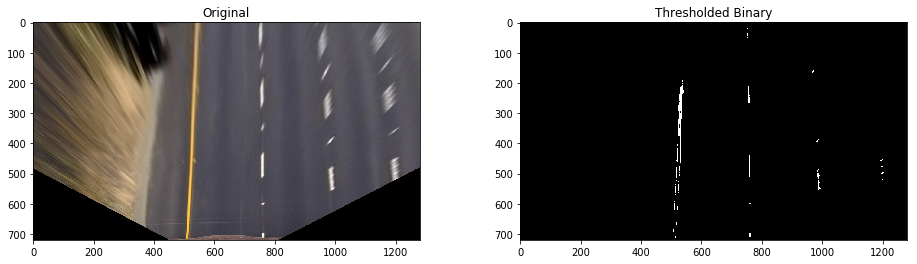

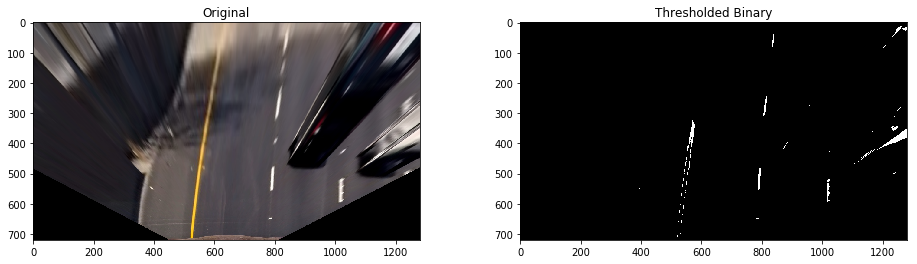

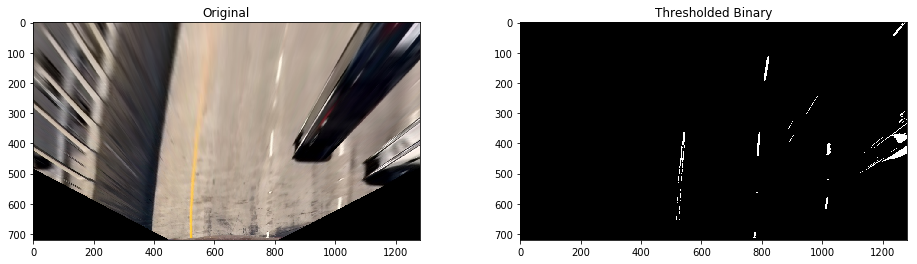

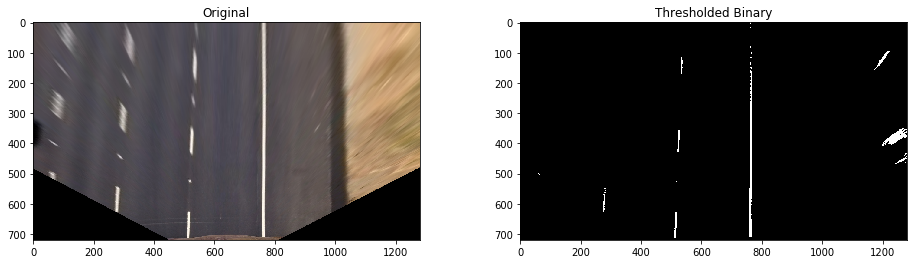

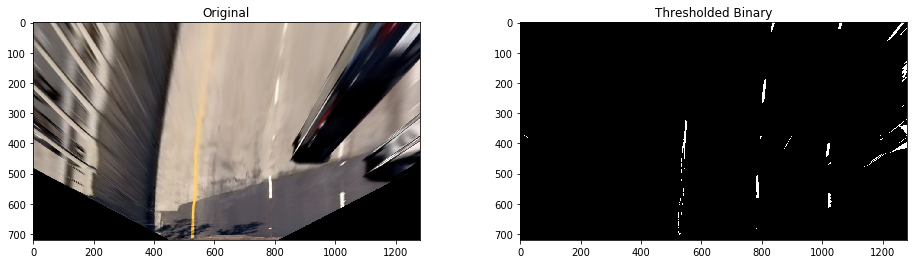

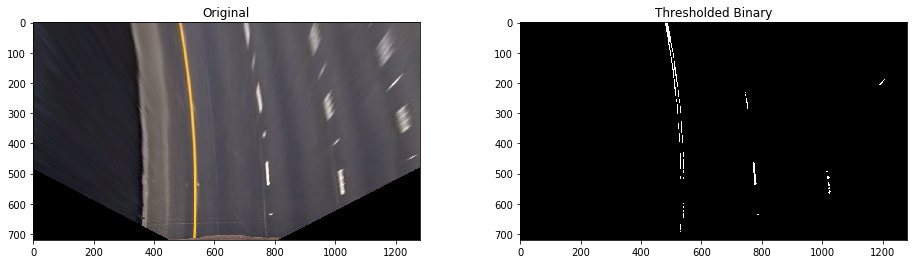

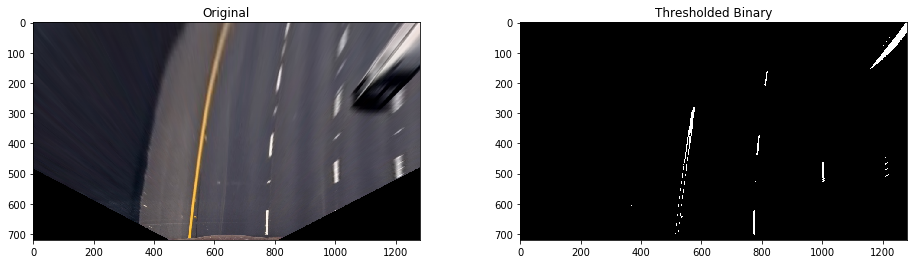

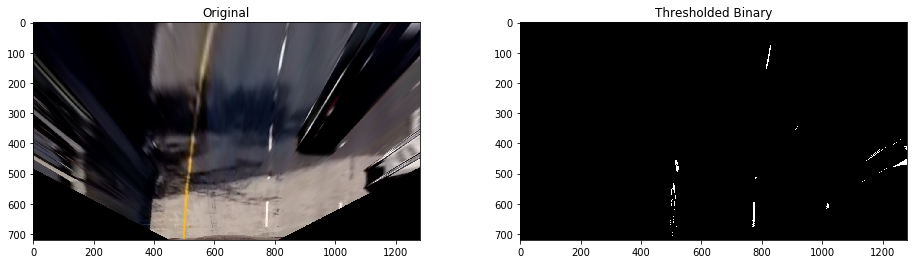

In [27]:
add = './output_images/perspective_transformation_output/*'

l_low_thresh = 220
l_high_thresh = 255
b_low_thresh = 160
b_high_thresh = 170

thresholded_binary = generate_thresholded_binary_dir(add, l_low_thresh, l_high_thresh, b_low_thresh, b_high_thresh, fig=True, imsave=True)

## Next, I used a technique called the Sliding Window to extract a polynomial for each lane line. The idea is to iterate a fixed size window over the image, starting from the bottom of the lane and going up with a fixed step size, each time shifting its position left or right to recenter it above the line.

### Initially, we calculate a histogram for the binary image, then look for the highest values in the second and third quadrants to use them as the starting points for the windows.

### After some trial and error, I settled for using 8 window steps vertically.

### The output is saved into the 'sliding_window_output' directory.

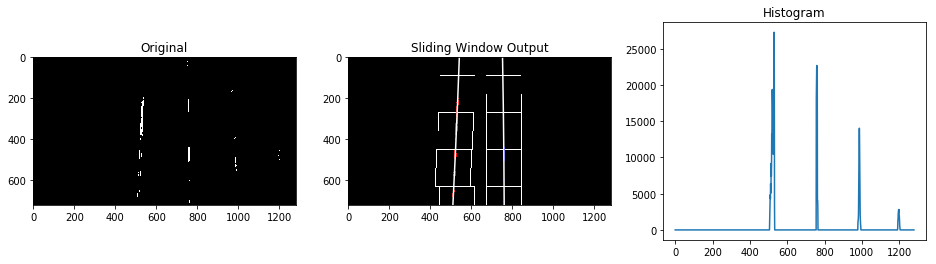

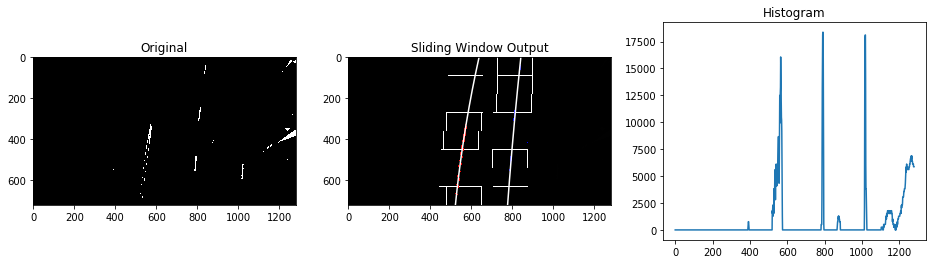

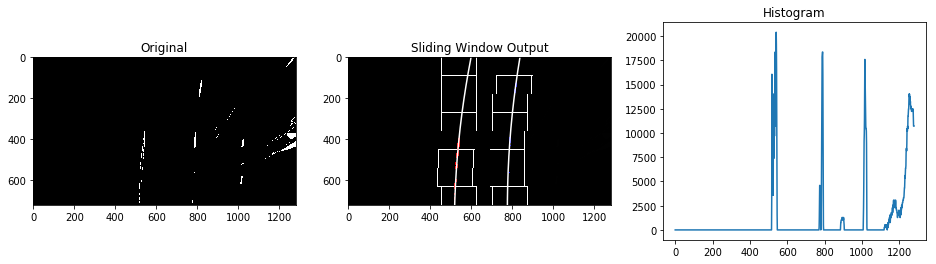

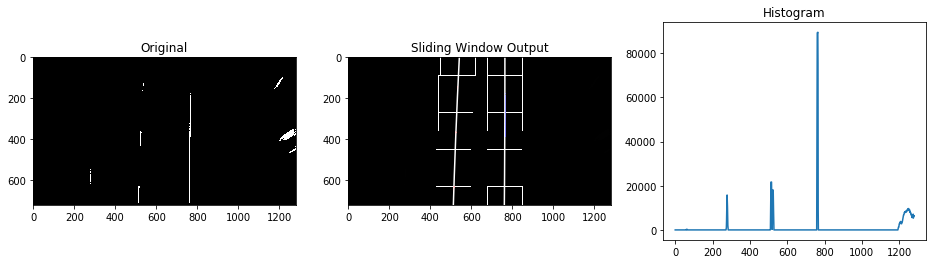

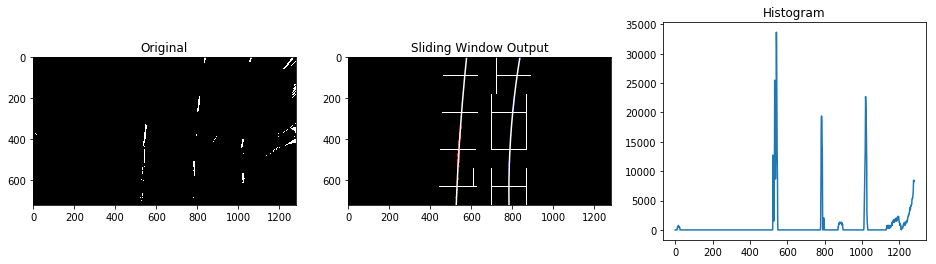

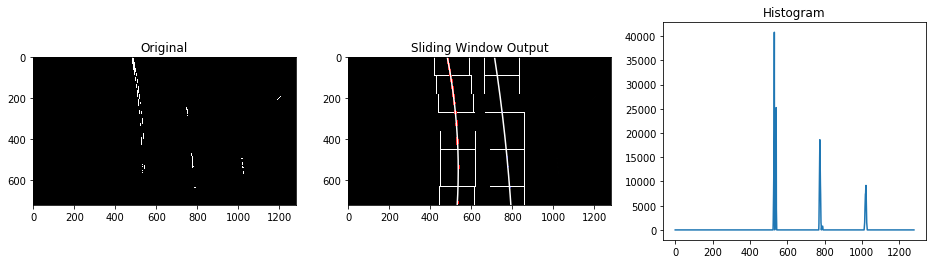

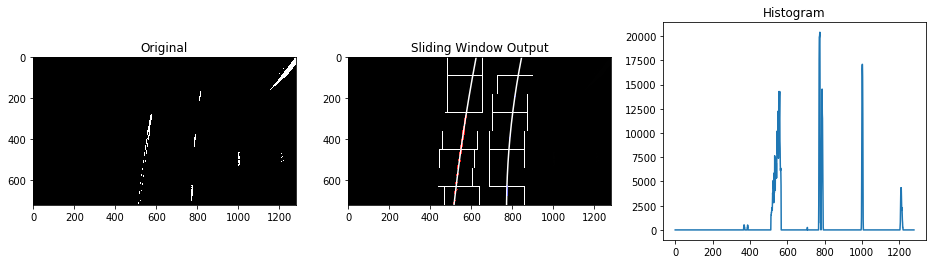

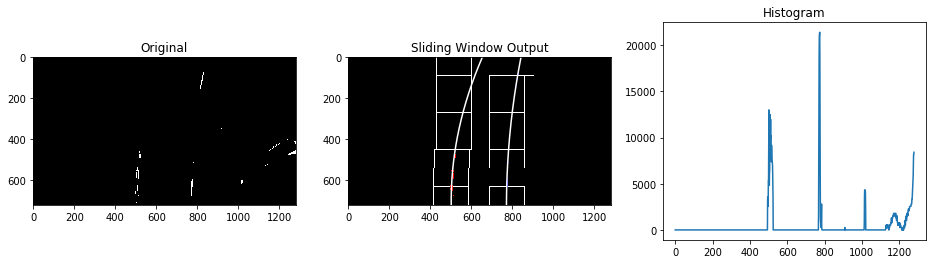

In [28]:
num_of_windows = 8
margin = 85
min_num_of_px = 40
        
lanes_out = find_lanes_dir('./output_images/thresholding_binary_output/*', num_of_windows, margin, min_num_of_px, fig=True, imsave=True)

## Finally, after we've successfully extracted and plotted the two polynomials representing the two lanes, we project those lines again onto the original image by performing the Inverse Perspective Transformation to the transformation we used earlier.

## We also use the polynomials to calculate the radius of curvature in meters (since we know what the value of the real distance between the lanes should be)

## Finally, we calculate how far off from the center of the two lanes the car is in meters.

### The output is saved into the 'lane_projection_output' directory.

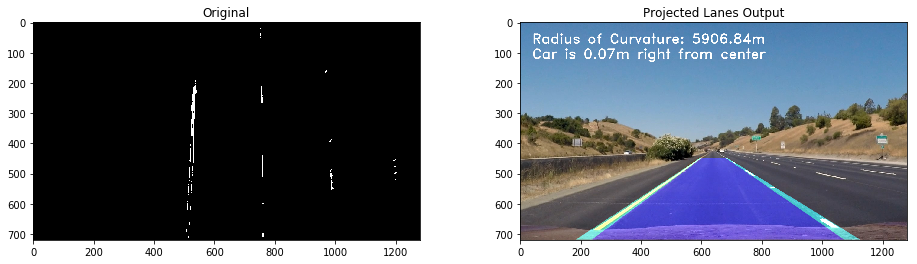

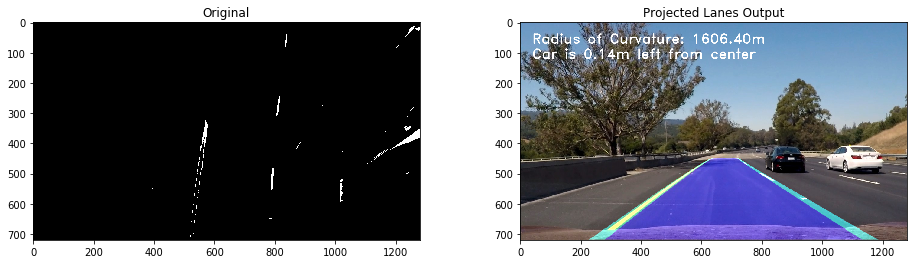

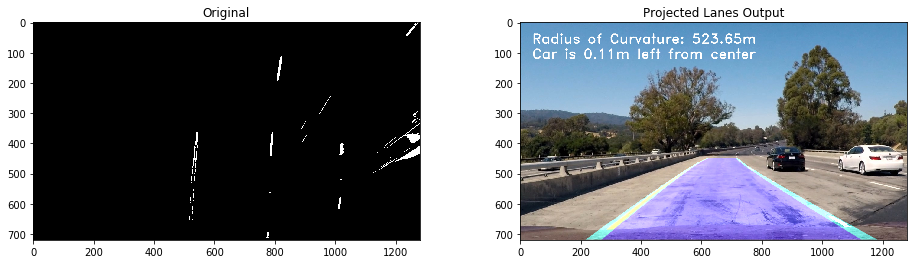

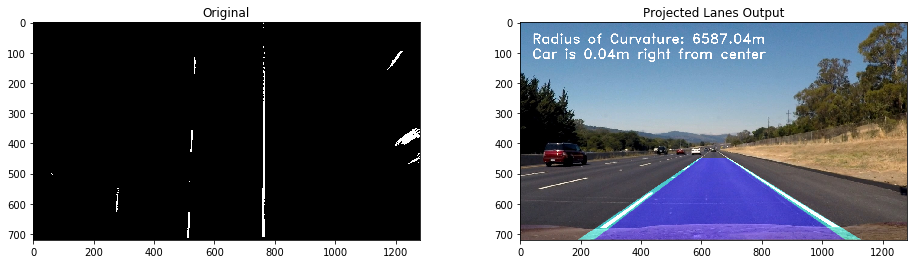

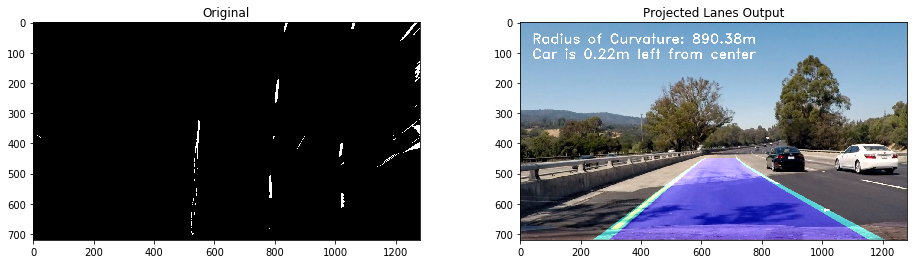

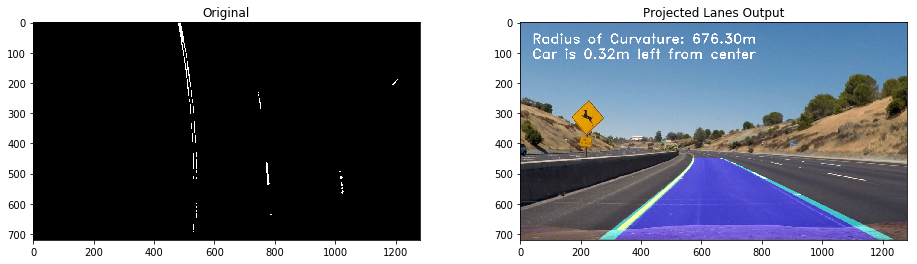

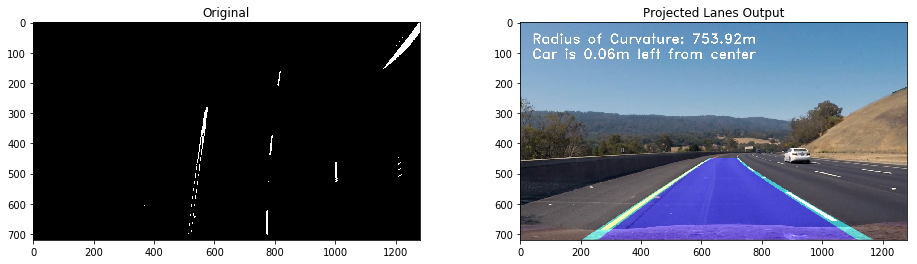

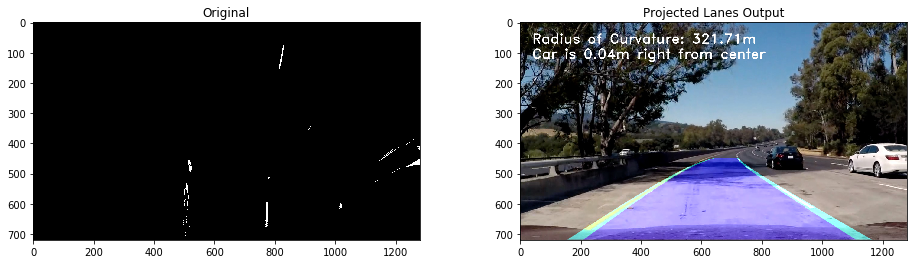

In [79]:
out = draw_lanes_dir('./output_images/thresholding_binary_output/*', lanes_out, persp_out, fig=True, imsave=True)

## The function below performs all the previous pipeline steps on a given frame.

In [80]:
with open('calibration_data.pkl', 'rb') as input:
    ret, mtx, dist, rvecs, tvecs = pickle.load(input)

def pipeline(im, imshow=False):
    
    undst = correct_for_distortion(im, mtx, dist)
    
    if imshow:
        plt.figure()
        plt.title('undst')
        plt.imshow(undst)
    
    warp, m, m_inv = trapezoid_birds_eye_view_transform(undst, trapezoid)

    if imshow:
        plt.figure()
        plt.imshow(warp)
    
    l_low_thresh = 220
    l_high_thresh = 255
    b_low_thresh = 160
    b_high_thresh = 170

    binary = generate_thresholded_binary(cv2.cvtColor(warp, cv2.COLOR_BGR2RGB), l_low_thresh, l_high_thresh, b_low_thresh, b_high_thresh)
    
    if imshow:
        plt.figure()
        plt.imshow(binary, cmap='gray')
    
    num_of_windows = 10
    margin = 80
    min_num_of_px = 40
        
    ret, out, left_fit, right_fit, ploty, left_fitx, right_fitx, _, _, _, _, _ = find_lanes(binary, num_of_windows, margin, min_num_of_px)
    
    if imshow:
        plt.figure()
        plt.imshow(out, cmap='gray')
    
    lanes = draw_lane(im, binary, left_fitx, right_fitx, left_fit, right_fit, m_inv)
    
    if imshow:
        plt.figure()
        plt.imshow(cv2.cvtColor(lanes, cv2.COLOR_BGR2RGB))
    
    return lanes

## Then we process the video using the pipeline and preview the output 

In [81]:
video_output = 'project_video_output.mp4'

project_video = VideoFileClip("project_video.mp4").fl_image(pipeline)

%time project_video.write_videofile(video_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [06:15<00:00,  3.32it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 3min 20s, sys: 1.61 s, total: 3min 21s
Wall time: 6min 19s


In [82]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output))